**Dataset CAR DETAILS V4**

In [2]:
#Importe de librerias Para EDA
from sklearn.impute import SimpleImputer
import seaborn as sns
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

In [9]:
import pandas as pd

try:
    # Leer el archivo CSV
    df = pd.read_csv("car details v4.csv", delimiter=',')  # Especificar el delimitador si es necesario

    # Mostrar las primeras filas del DataFrame
    print(df.head())
    
    # Mostrar información adicional sobre el DataFrame
    print(df.info())

except FileNotFoundError:
    print("Error: El archivo 'car details v4.csv' no se encontró.")
except pd.errors.EmptyDataError:
    print("Error: El archivo está vacío.")
except pd.errors.ParserError:
    print("Error: Hubo un problema al analizar el archivo.")

            Make                            Model    Price  Year  Kilometer  \
0          Honda              Amaze 1.2 VX i-VTEC   505000  2017      87150   
1  Maruti Suzuki                  Swift DZire VDI   450000  2014      75000   
2        Hyundai             i10 Magna 1.2 Kappa2   220000  2011      67000   
3         Toyota                         Glanza G   799000  2019      37500   
4         Toyota  Innova 2.4 VX 7 STR [2016-2020]  1950000  2018      69000   

  Fuel Type Transmission   Location   Color   Owner Seller Type   Engine  \
0    Petrol       Manual       Pune    Grey   First   Corporate  1198 cc   
1    Diesel       Manual   Ludhiana   White  Second  Individual  1248 cc   
2    Petrol       Manual    Lucknow  Maroon   First  Individual  1197 cc   
3    Petrol       Manual  Mangalore     Red   First  Individual  1197 cc   
4    Diesel       Manual     Mumbai    Grey   First  Individual  2393 cc   

            Max Power              Max Torque Drivetrain  Length   W

In [11]:
# Información general del DataSet
num_filas, num_columnas = df.shape
print(f"Número de filas: {num_filas}, Número de columnas: {num_columnas}\n")

# Información general de los datos
print("Información del DataFrame:")
print(df.info())

# Mostrar estadísticas descriptivas para datos numéricos
print("\nEstadísticas descriptivas:")
print(df.describe())

# Verificar si hay valores nulos en el DataFrame
print("\nValores nulos en cada columna:")
print(df.isnull().sum())

Número de filas: 2059, Número de columnas: 20

Información del DataFrame:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2059 entries, 0 to 2058
Data columns (total 20 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   Make                2059 non-null   object 
 1   Model               2059 non-null   object 
 2   Price               2059 non-null   int64  
 3   Year                2059 non-null   int64  
 4   Kilometer           2059 non-null   int64  
 5   Fuel Type           2059 non-null   object 
 6   Transmission        2059 non-null   object 
 7   Location            2059 non-null   object 
 8   Color               2059 non-null   object 
 9   Owner               2059 non-null   object 
 10  Seller Type         2059 non-null   object 
 11  Engine              1979 non-null   object 
 12  Max Power           1979 non-null   object 
 13  Max Torque          1979 non-null   object 
 14  Drivetrain          1923 non-n

In [13]:
data_descripcion = {
    "Make": {
        "descripcion": "Marca del vehículo.",
        "tipo_dato": "object (cadena de texto)"
    },
    "Model": {
        "descripcion": "Modelo del vehículo.",
        "tipo_dato": "object (cadena de texto)"
    },
    "Price": {
        "descripcion": "Precio del vehículo en la moneda correspondiente.",
        "tipo_dato": "int64 (entero)"
    },
    "Year": {
        "descripcion": "Año de fabricación del vehículo.",
        "tipo_dato": "int64 (entero)"
    },
    "Kilometer": {
        "descripcion": "Kilometraje recorrido por el vehículo (en kilómetros).",
        "tipo_dato": "int64 (entero)"
    },
    "Fuel Type": {
        "descripcion": "Tipo de combustible utilizado por el vehículo (por ejemplo, gasolina, diésel).",
        "tipo_dato": "object (cadena de texto)"
    },
    "Transmission": {
        "descripcion": "Tipo de transmisión del vehículo (manual o automática).",
        "tipo_dato": "object (cadena de texto)"
    },
    "Location": {
        "descripcion": "Ubicación donde se vende el vehículo.",
        "tipo_dato": "object (cadena de texto)"
    },
    "Color": {
        "descripcion": "Color del vehículo.",
        "tipo_dato": "object (cadena de texto)"
    },
    "Owner": {
        "descripcion": "Número de dueños anteriores del vehículo.",
        "tipo_dato": "object (cadena de texto)"
    },
    "Seller Type": {
        "descripcion": "Tipo de vendedor (por ejemplo, concesionario, individuo).",
        "tipo_dato": "object (cadena de texto)"
    },
    "Engine": {
        "descripcion": "Capacidad del motor del vehículo (generalmente en centímetros cúbicos, cc).",
        "tipo_dato": "object (cadena de texto, algunos valores faltantes)"
    },
    "Max Power": {
        "descripcion": "Potencia máxima generada por el motor del vehículo (en caballos de fuerza o kilovatios).",
        "tipo_dato": "object (cadena de texto, algunos valores faltantes)"
    },
    "Max Torque": {
        "descripcion": "Torque del vehículo, que indica la fuerza que el motor puede generar.",
        "tipo_dato": "object (cadena de texto, algunos valores faltantes)"
    },
    "Drivetrain": {
        "descripcion": "Tipo de transmisión del vehículo (tracción delantera, trasera o total).",
        "tipo_dato": "object (cadena de texto, algunos valores faltantes)"
    },
    "Length": {
        "descripcion": "Longitud del vehículo (en milímetros o centímetros).",
        "tipo_dato": "float64 (número decimal, algunos valores faltantes)"
    },
    "Width": {
        "descripcion": "Ancho del vehículo (en milímetros o centímetros).",
        "tipo_dato": "float64 (número decimal, algunos valores faltantes)"
    },
    "Height": {
        "descripcion": "Altura del vehículo (en milímetros o centímetros).",
        "tipo_dato": "float64 (número decimal, algunos valores faltantes)"
    },
    "Seating Capacity": {
        "descripcion": "Número de asientos en el vehículo.",
        "tipo_dato": "float64 (número decimal, algunos valores faltantes)"
    },
    "Fuel Tank Capacity": {
        "descripcion": "Capacidad del tanque de combustible del vehículo (en litros).",
        "tipo_dato": "float64 (número decimal, algunos valores faltantes)"
    }
}

Estadísticas descriptivas para columnas numéricas:
              Price         Year     Kilometer       Length        Width  \
count  2.059000e+03  2059.000000  2.059000e+03  1995.000000  1995.000000   
mean   1.702992e+06  2016.425449  5.422471e+04  4280.860652  1767.991980   
std    2.419881e+06     3.363564  5.736172e+04   442.458507   135.265825   
min    4.900000e+04  1988.000000  0.000000e+00  3099.000000  1475.000000   
25%    4.849990e+05  2014.000000  2.900000e+04  3985.000000  1695.000000   
50%    8.250000e+05  2017.000000  5.000000e+04  4370.000000  1770.000000   
75%    1.925000e+06  2019.000000  7.200000e+04  4629.000000  1831.500000   
max    3.500000e+07  2022.000000  2.000000e+06  5569.000000  2220.000000   

            Height  Seating Capacity  Fuel Tank Capacity  
count  1995.000000       1995.000000         1946.000000  
mean   1591.735338          5.306266           52.002210  
std     136.073956          0.822170           15.110198  
min    1165.000000          

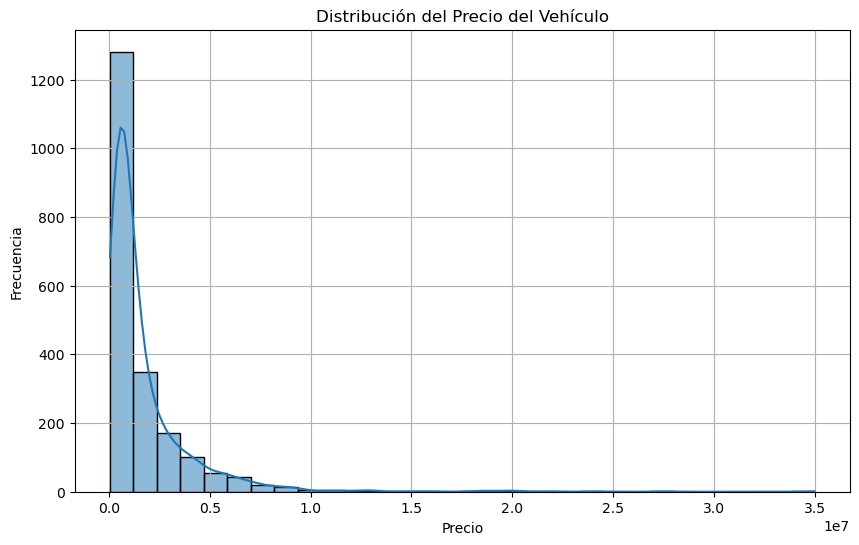

In [15]:
# Estadísticas descriptivas para columnas numéricas
print("Estadísticas descriptivas para columnas numéricas:")
print(df.describe())

# Estadísticas descriptivas para columnas categóricas
print("\nEstadísticas descriptivas para columnas categóricas:")
print(df.describe(include='object'))

# Si deseas visualizar la distribución de algunas variables, puedes usar seaborn o matplotlib
import matplotlib.pyplot as plt
import seaborn as sns

# Gráfico de distribución del precio
plt.figure(figsize=(10, 6))
sns.histplot(df['Price'], bins=30, kde=True)
plt.title('Distribución del Precio del Vehículo')
plt.xlabel('Precio')
plt.ylabel('Frecuencia')
plt.grid(True)
plt.show()

Cantidad de valores nulos en cada columna:
Engine                 80
Max Power              80
Max Torque             80
Drivetrain            136
Length                 64
Width                  64
Height                 64
Seating Capacity       64
Fuel Tank Capacity    113
dtype: int64


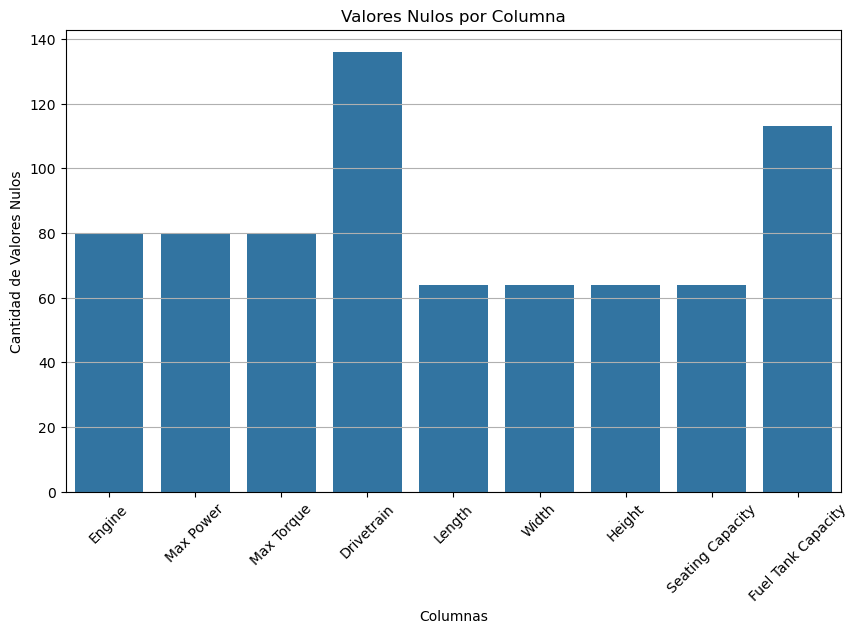

In [17]:
# Verificar y mostrar la cantidad de valores nulos en cada columna
null_counts = df.isnull().sum()

# Filtrar solo las columnas con valores nulos
null_counts_filtered = null_counts[null_counts > 0]

# Mensaje descriptivo
print("Cantidad de valores nulos en cada columna:")
if null_counts_filtered.empty:
    print("No hay valores nulos en el DataFrame.")
else:
    print(null_counts_filtered)

# Visualización opcional de valores nulos
import matplotlib.pyplot as plt
import seaborn as sns

plt.figure(figsize=(10, 6))
sns.barplot(x=null_counts_filtered.index, y=null_counts_filtered.values)
plt.title('Valores Nulos por Columna')
plt.xlabel('Columnas')
plt.ylabel('Cantidad de Valores Nulos')
plt.xticks(rotation=45)
plt.grid(axis='y')
plt.show()

**NOTA**:Existen varios campos con valores Faltantes, tanto en Datos categoricos, como en datos numericos.

In [19]:
# Identificar columnas numéricas en el DataFrame
columnas_numericas = df.select_dtypes(include=['number'])

# Verificar cuáles de las columnas numéricas tienen valores nulos
columnas_con_nulos_numericos = columnas_numericas.columns[columnas_numericas.isnull().sum() > 0]

# Mostrar las columnas numéricas que tienen valores nulos con un mensaje descriptivo
print("Columnas numéricas que tienen valores nulos:")
if len(columnas_con_nulos_numericos) == 0:
    print("No hay columnas numéricas con valores nulos.")
else:
    print(columnas_con_nulos_numericos.tolist())

Columnas numéricas que tienen valores nulos:
['Length', 'Width', 'Height', 'Seating Capacity', 'Fuel Tank Capacity']


**Imputacion Columnas Numericas faltantes**


Comprobando valores nulos después de la imputación...
Make                    0
Model                   0
Price                   0
Year                    0
Kilometer               0
Fuel Type               0
Transmission            0
Location                0
Color                   0
Owner                   0
Seller Type             0
Engine                 80
Max Power              80
Max Torque             80
Drivetrain            136
Length                  0
Width                   0
Height                  0
Seating Capacity        0
Fuel Tank Capacity      0
dtype: int64


<Figure size 1200x600 with 0 Axes>

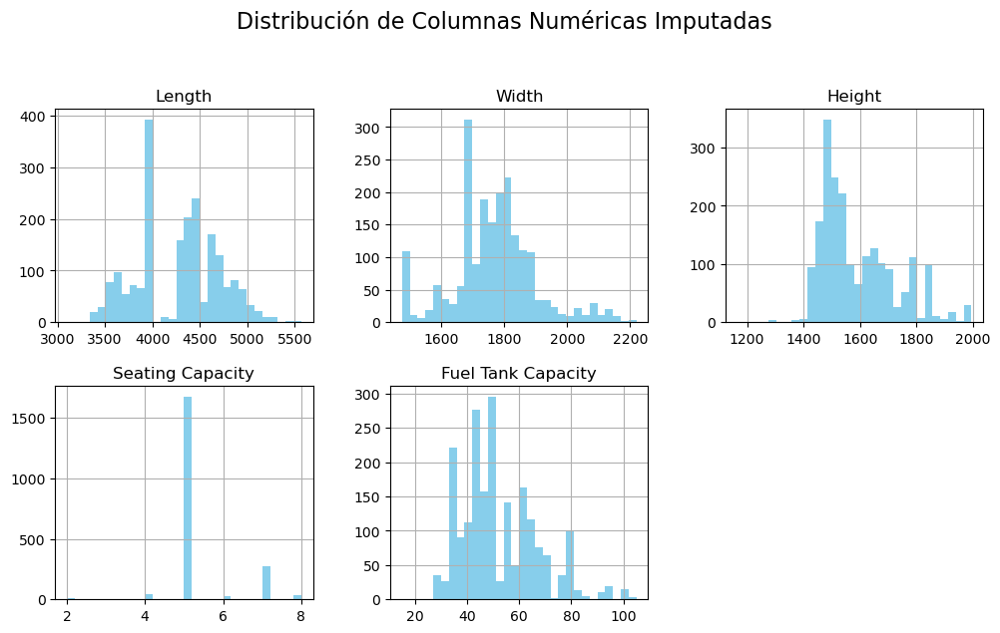

In [21]:
from sklearn.impute import SimpleImputer

# Imputar valores nulos en columnas numéricas usando la mediana
imputacion_mediana = SimpleImputer(strategy="median")

# Imputar la mediana en las columnas con valores nulos
df[columnas_con_nulos_numericos] = imputacion_mediana.fit_transform(df[columnas_con_nulos_numericos])

# Mensaje descriptivo antes de verificar valores nulos
print("Comprobando valores nulos después de la imputación...")

# Comprobamos que hayan desaparecido los valores nulos en las columnas numéricas    
valores_nulos_post_imputacion = df.isnull().sum()

# Mostrar la cantidad de valores nulos después de la imputación
print(valores_nulos_post_imputacion)

# Visualización opcional de la distribución de las columnas imputadas
import matplotlib.pyplot as plt

plt.figure(figsize=(12, 6))
df[columnas_con_nulos_numericos].hist(bins=30, figsize=(12, 10), layout=(3, 3), color='skyblue')
plt.suptitle('Distribución de Columnas Numéricas Imputadas', fontsize=16)
plt.xlabel('Valores')
plt.ylabel('Frecuencia')
plt.show()


In [23]:
# Identificar columnas con datos categóricos en el DataFrame
columnas_categoricas = df.select_dtypes(include=['object'])

# Verificar cuáles de las columnas categóricas tienen valores nulos
columnas_con_nulos_categoricos = columnas_categoricas.columns[columnas_categoricas.isnull().sum() > 0]

# Mostrar las columnas categóricas que tienen valores nulos con un mensaje descriptivo
print("Columnas categóricas que tienen valores nulos:")
if len(columnas_con_nulos_categoricos) == 0:
    print("No hay columnas categóricas con valores nulos.")
else:
    print(columnas_con_nulos_categoricos.tolist())


Columnas categóricas que tienen valores nulos:
['Engine', 'Max Power', 'Max Torque', 'Drivetrain']


**Imputacion Datos Categoricos**

Para los datos categoricos faltantes vamos a usar como referencia la columna **Modelo**, pues hay  **modelos que se repiten** y tienen **informacion que puede complementar** los datos nulos de otros vehiculos del **mismo modelo**.Ahora bien, si dentro del analisis **se detectan vehiculos del mismo modelo pero sin** los datos necesarios se imputaran los datos faltantes **usando la moda.**

In [25]:
from sklearn.impute import SimpleImputer

# Inicializar el imputador para datos categóricos con la moda
imputacion_categoricos = SimpleImputer(strategy='most_frequent')

# Imputar valores nulos en columnas categóricas
for col in columnas_con_nulos_categoricos:
    # Filtrar solo las filas donde la columna tiene valores nulos
    datos_nulos = df[df[col].isnull()]

    # Recorrer cada fila con valores nulos
    for index, row in datos_nulos.iterrows():
        modelo = row['Model']
        
        # Conteo de modelos similares
        conteo = (df['Model'] == modelo).sum()
        
        if conteo > 1:
            # Filtrar los autos del mismo modelo
            autos_mismo_modelo = df[df['Model'] == modelo]
            
            # Buscar un registro del mismo modelo donde la columna no sea nula
            registro_completo = autos_mismo_modelo[autos_mismo_modelo[col].notnull()]
            
            if not registro_completo.empty:
                # Tomar el primer valor completo de esa columna para ese modelo
                valor_a_imputar = registro_completo[col].iloc[0]
                
                # Imputar el valor en los registros que tienen el dato nulo
                df.loc[df['Model'] == modelo, col] = df.loc[df['Model'] == modelo, col].fillna(valor_a_imputar)
        
        # Si solo hay un registro asociado al modelo, se imputa por la moda  
        elif conteo < 2:
            # Imputar la moda para las columnas categóricas
            df[col] = imputacion_categoricos.fit_transform(df[[col]]).ravel()

# Mensaje final para confirmar la imputación
print("Imputación completada para las columnas categóricas.")

Imputación completada para las columnas categóricas.


In [27]:
def detectar_atipicos(data):
    """
    Función para detectar valores atípicos extremos utilizando el rango intercuartílico (IQR).
    
    Args:
    data (Series): Serie de datos numéricos.

    Returns:
    Series: Serie que contiene los valores atípicos detectados.
    """
    Q1 = data.quantile(0.25)  # Primer cuartil
    Q3 = data.quantile(0.75)  # Tercer cuartil
    IQR = Q3 - Q1  # Rango intercuartílico
    limite_inferior = Q1 - 1.5 * IQR  # Límite inferior
    limite_superior = Q3 + 1.5 * IQR  # Límite superior
    
    # Devolver los valores atípicos
    return data[(data < limite_inferior) | (data > limite_superior)]

# Aplicar la función a cada columna numérica y guardar resultados
valores_atipicos = {}

# Se detectan los datos atípicos, exceptuando a Price (Variable Objetivo) y Kilometer (Información de relevancia)
for col in columnas_numericas:
    if col not in ['Price', 'Kilometer']:
        atipicos = detectar_atipicos(df[col])
        valores_atipicos[col] = atipicos.dropna()  # Guardar solo los valores atípicos

# Mostrar resultados
for col, atipicos in valores_atipicos.items():
    print(f"Valores atípicos en '{col}': {atipicos.values}")


Valores atípicos en 'Year': [2006 2006 2004 2002 1988 2000 1996]
Valores atípicos en 'Length': []
Valores atípicos en 'Width': [1490. 2141. 1475. 2044. 2044. 1490. 2094. 2069. 2141. 1490. 2094. 2094.
 2141. 1490. 2183. 2141. 1490. 1490. 2071. 2073. 1475. 2155. 2069. 1475.
 1475. 2094. 2094. 1475. 1490. 2141. 1475. 1475. 1475. 2120. 1490. 2120.
 1475. 2071. 2157. 2044. 2044. 2120. 1475. 1475. 1490. 1475. 2157. 1490.
 2157. 2094. 2044. 2044. 1475. 1475. 2120. 2220. 1475. 2141. 2094. 1490.
 1490. 1475. 2091. 2073. 2157. 2044. 2044. 1475. 2073. 2157. 2069. 1475.
 2110. 2120. 2069. 2141. 1475. 2094. 1475. 1475. 1475. 2073. 1475. 2139.
 2069. 2069. 1475. 2080. 2071. 1475. 1475. 1490. 2141. 2094. 2141. 1475.
 2094. 1475. 2141. 1490. 2044. 2120. 2220. 2094. 2094. 1490. 2173. 1475.
 2044. 1490. 2094. 1475. 2220. 2069. 2091. 2220. 2105. 1475. 2141. 1490.
 2120. 2141. 1475. 1490. 2157. 1490. 2141. 2044. 1490. 2094. 2120. 1490.
 1490. 2094. 1490. 1475. 1490. 2094. 2044. 2141. 1475. 1475. 2044. 147

In [29]:
# Conjunto para almacenar los índices de todas las filas con valores atípicos
indices_atipicos = set()

# Recopilar los índices de las filas atípicas
for col, atipicos in valores_atipicos.items():
    # Actualizar el conjunto de índices con los índices de los atípicos
    indices_atipicos.update(atipicos.index)

# Eliminar las filas atípicas usando sus índices
df.drop(index=indices_atipicos, inplace=True)

# Mostrar la nueva forma del DataFrame después de eliminar los valores atípicos
print("Nueva forma del DataFrame después de eliminar valores atípicos:", df.shape)


Nueva forma del DataFrame después de eliminar valores atípicos: (1506, 20)


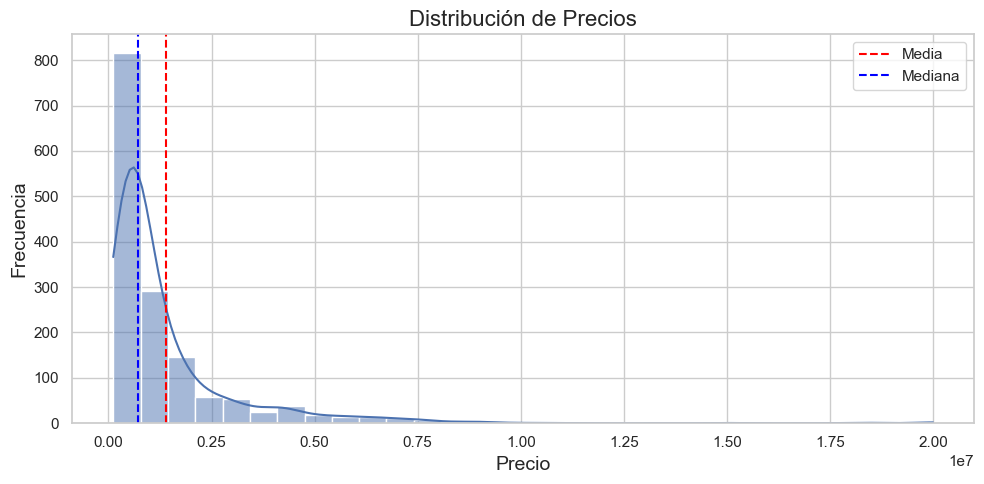

In [31]:
import matplotlib.pyplot as plt
import seaborn as sns

# Establecer estilo para las gráficas
sns.set(style='whitegrid')

# Análisis de la variable dependiente (Price)
plt.figure(figsize=(10, 5))

# Histograma de precios
sns.histplot(df['Price'], bins=30, kde=True)  # Se añade una línea KDE para visualizar la densidad

# Títulos y etiquetas
plt.title('Distribución de Precios', fontsize=16)
plt.xlabel('Precio', fontsize=14)
plt.ylabel('Frecuencia', fontsize=14)

# Opcional: Añadir líneas de media y mediana
mean_price = df['Price'].mean()
median_price = df['Price'].median()
plt.axvline(mean_price, color='red', linestyle='--', label='Media')
plt.axvline(median_price, color='blue', linestyle='--', label='Mediana')

# Leyenda
plt.legend()

# Ajustar el diseño
plt.tight_layout()

# Mostrar la gráfica
plt.show()



**Observacion del Precio**: La distribucion de los precios indica que hay muchos mas vehiculos en precios bajos que precios altos, no se debe confundir la escala pues esta en 1e7.

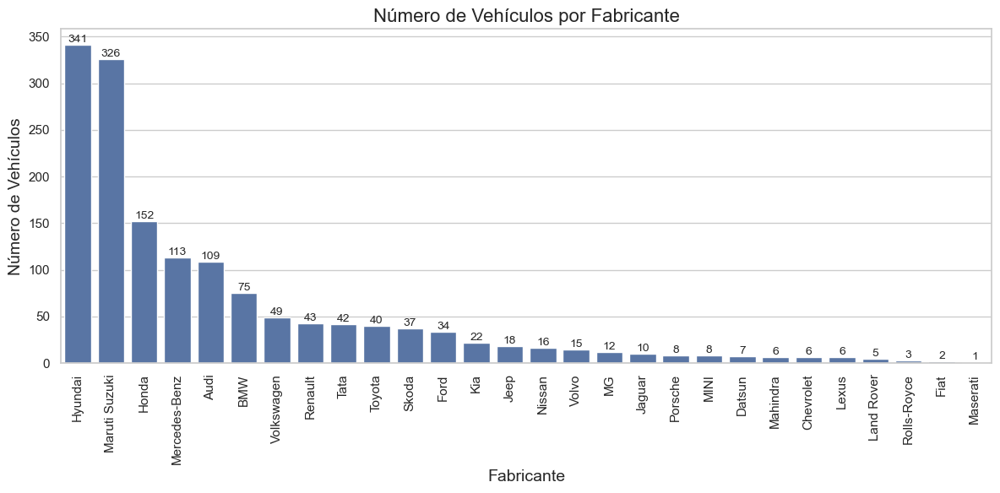

In [37]:
import matplotlib.pyplot as plt
import seaborn as sns

# Contar la cantidad de vehículos por fabricante
conteo_modelos = df['Make'].value_counts()

plt.figure(figsize=(12, 6))  # Tamaño de la figura

# Crear el gráfico de barras
sns.barplot(x=conteo_modelos.index, y=conteo_modelos.values)

# Títulos y etiquetas
plt.title('Número de Vehículos por Fabricante', fontsize=16)
plt.xlabel('Fabricante', fontsize=14)
plt.ylabel('Número de Vehículos', fontsize=14)
plt.xticks(rotation=90)  # Rotar las etiquetas del eje x

# Añadir anotaciones a las barras
for index, value in enumerate(conteo_modelos.values):
    plt.text(index, value, str(value), ha='center', va='bottom', fontsize=10)

# Ajustar el diseño para evitar superposición
plt.tight_layout()

# Mostrar la gráfica
plt.show()


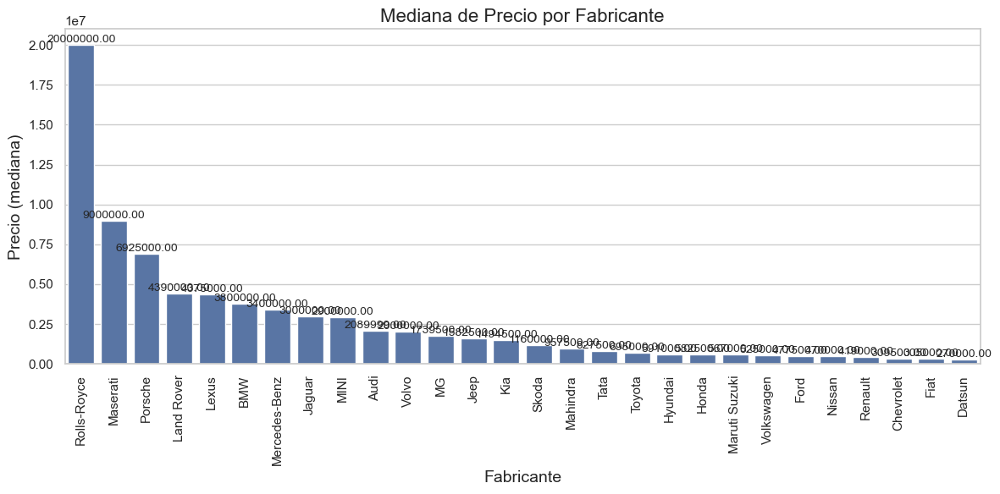

In [41]:
# Calcular la mediana de precios por fabricante
precios_maximos = df.groupby("Make")["Price"].median().sort_values(ascending=False)

# Crear el gráfico de barras
plt.figure(figsize=(12, 6))  # Tamaño de la figura
sns.barplot(x=precios_maximos.index, y=precios_maximos.values)

# Títulos y etiquetas
plt.title('Mediana de Precio por Fabricante', fontsize=16)
plt.xlabel('Fabricante', fontsize=14)
plt.ylabel('Precio (mediana)', fontsize=14)

# Añadir anotaciones a las barras
for index, value in enumerate(precios_maximos.values):
    plt.text(index, value, f'{value:.2f}', ha='center', va='bottom', fontsize=10)

plt.xticks(rotation=90)  # Rotar las etiquetas del eje x

# Ajustar el diseño para evitar superposición
plt.tight_layout()

# Mostrar la gráfica
plt.show()


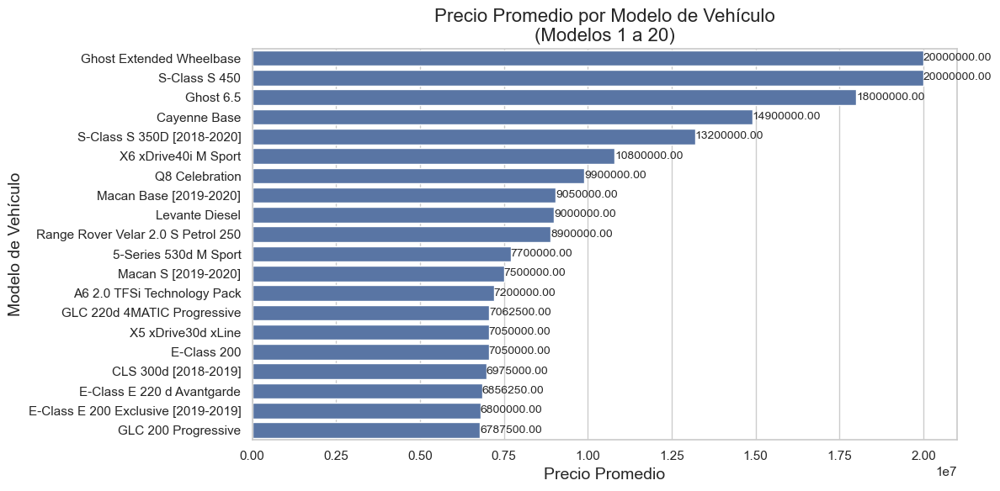

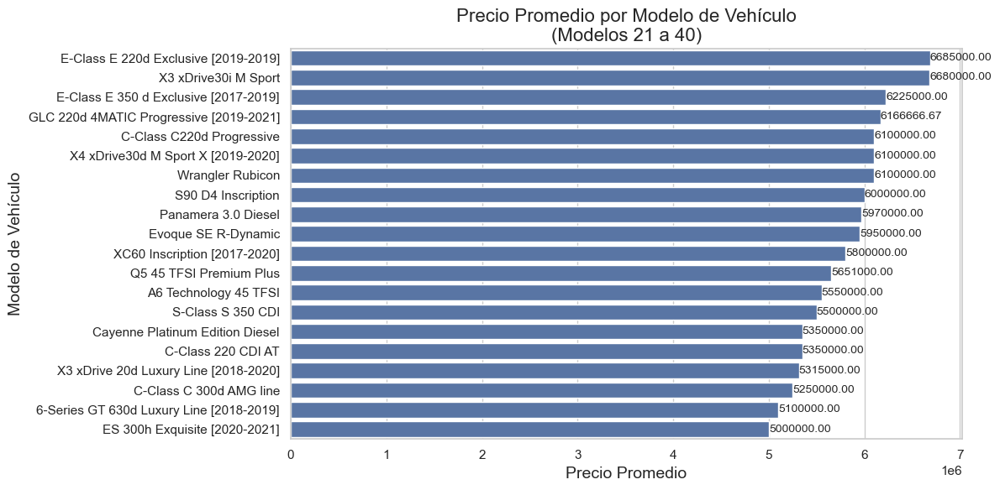

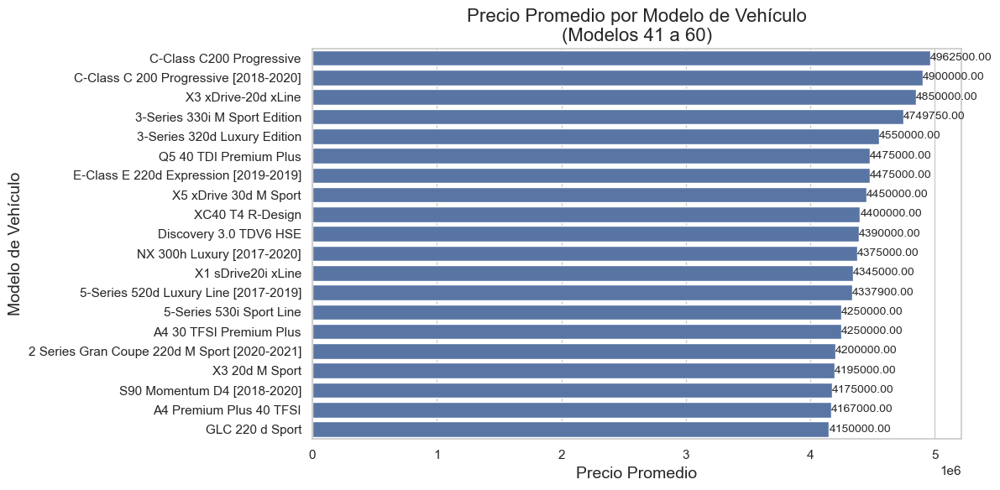

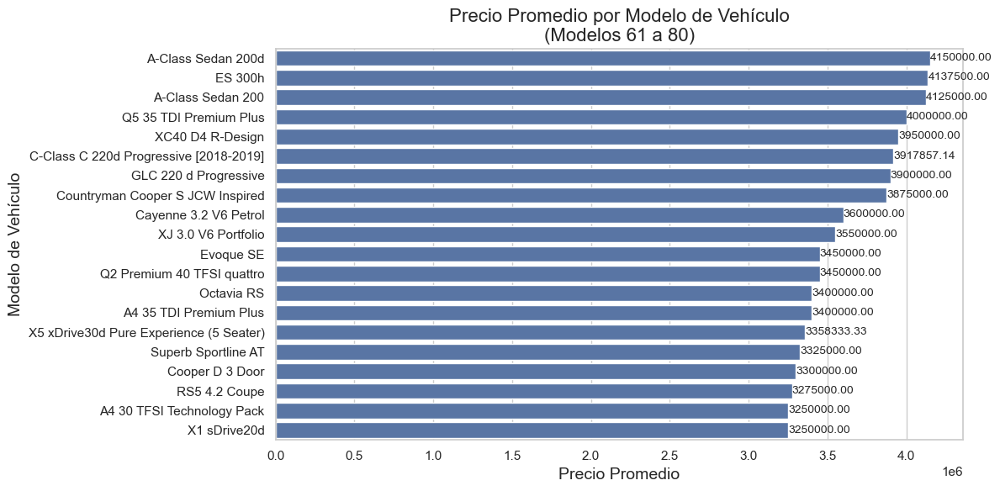

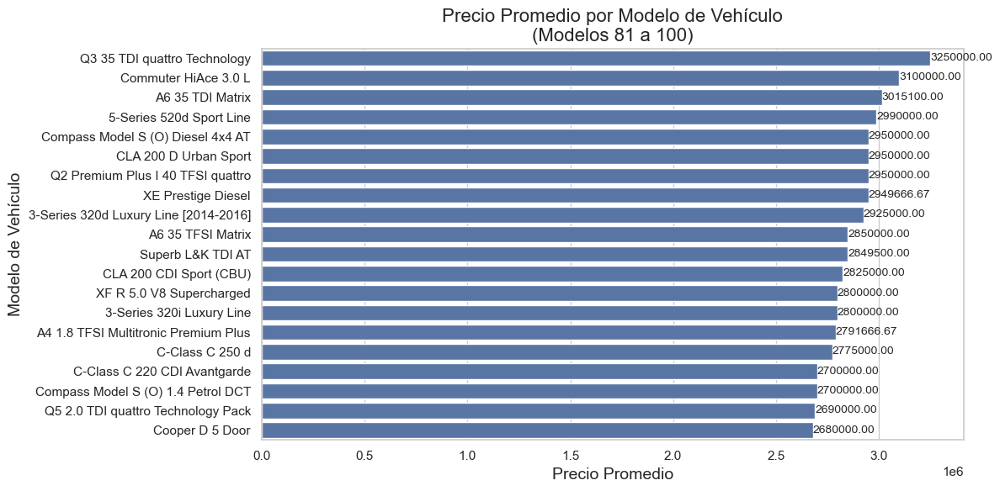

...

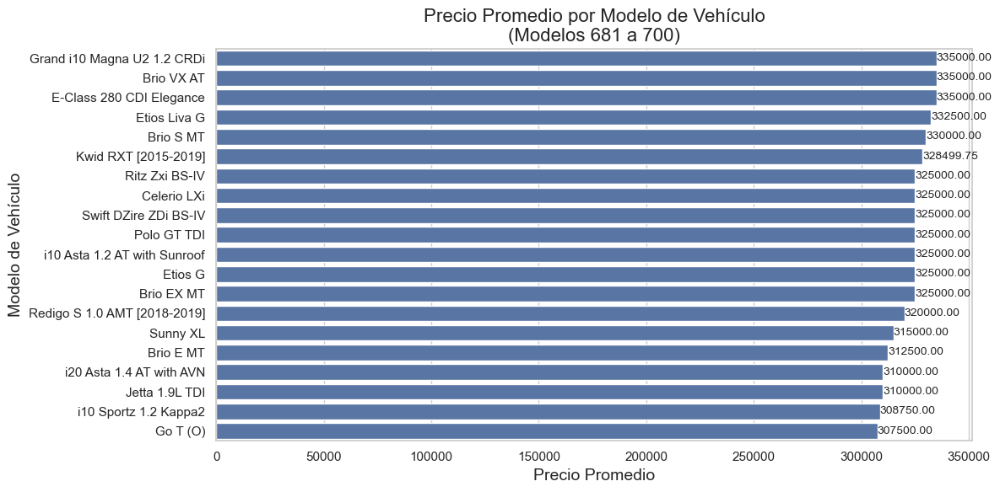

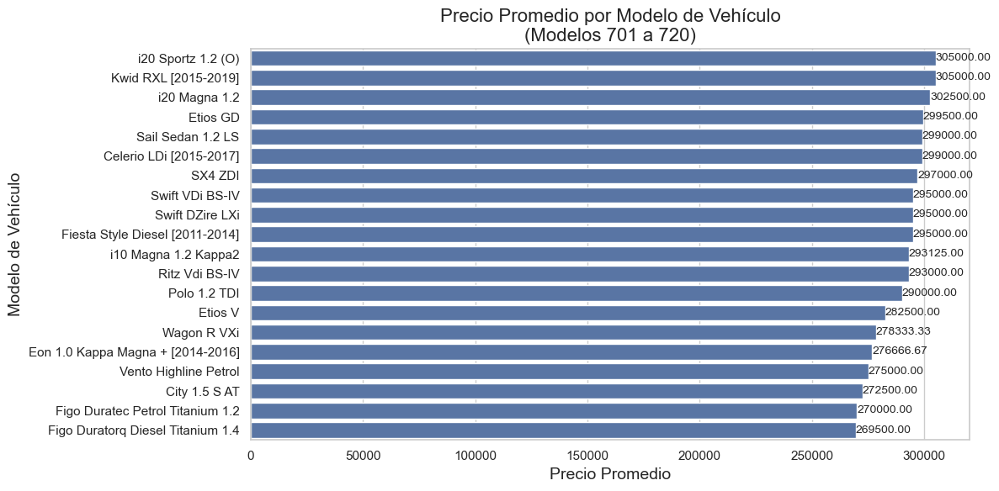

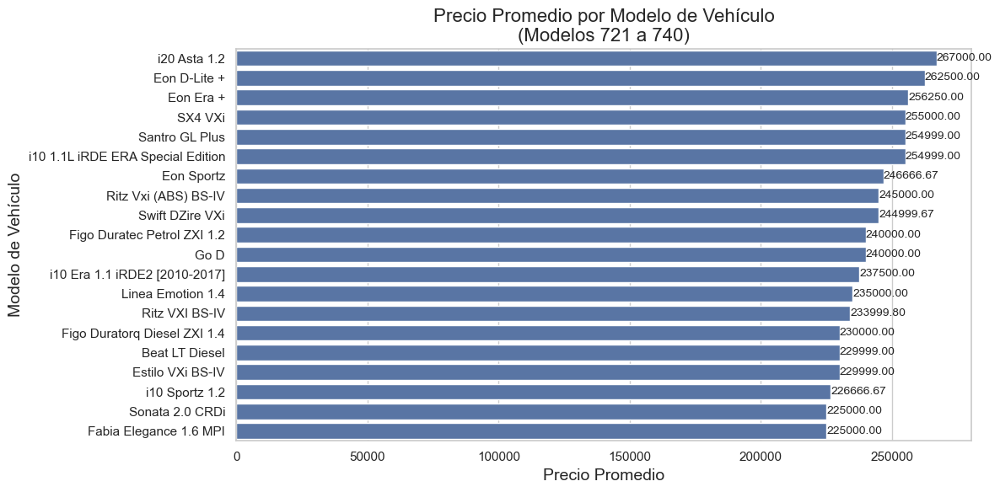

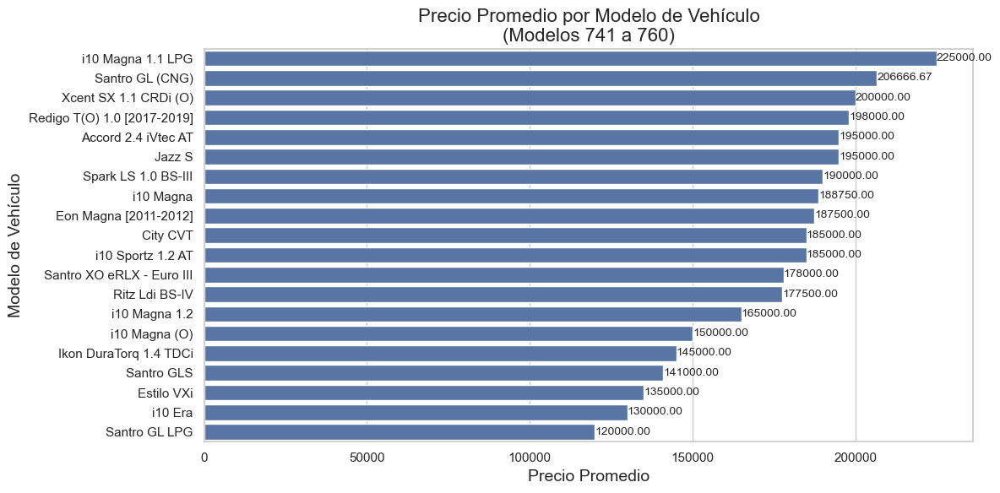

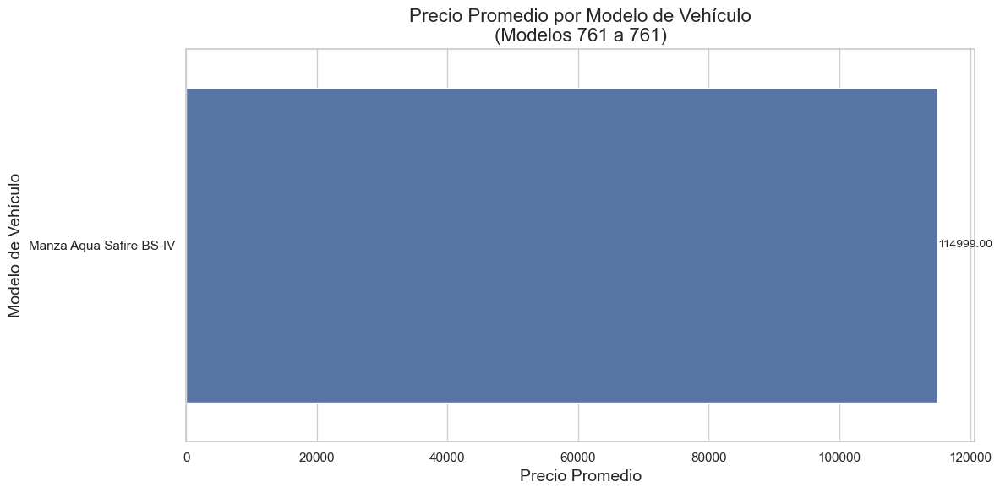

In [44]:
import matplotlib.pyplot as plt
import seaborn as sns

# Agrupar por modelo y calcular la media del precio
precio_por_modelo = df.groupby('Model')['Price'].mean().reset_index()

# Ordenar los modelos por precio
precio_por_modelo = precio_por_modelo.sort_values(by='Price', ascending=False)

n = 20  # Número de modelos por página
for i in range(0, len(precio_por_modelo), n):
    subset = precio_por_modelo.iloc[i:i+n]
    
    plt.figure(figsize=(12, 6))  # Tamaño de la figura
    sns.barplot(x='Price', y='Model', data=subset)

    # Títulos y etiquetas
    plt.title(f'Precio Promedio por Modelo de Vehículo\n(Modelos {i+1} a {min(i+n, len(precio_por_modelo))})', fontsize=16)
    plt.xlabel('Precio Promedio', fontsize=14)
    plt.ylabel('Modelo de Vehículo', fontsize=14)

    # Añadir anotaciones a las barras
    for index, value in enumerate(subset['Price']):
        plt.text(value, index, f'{value:.2f}', ha='left', va='center', fontsize=10)

    # Ajustar el diseño para evitar superposición
    plt.tight_layout()

    # Mostrar la gráfica
    plt.show()


**En el dataset Se encuentran con alrededor de 1050 modelos de vehiculos , al graficar los precios en relacion a los modelos , se refleja la tendencia donde el modelo tiene influencia en el precio.**

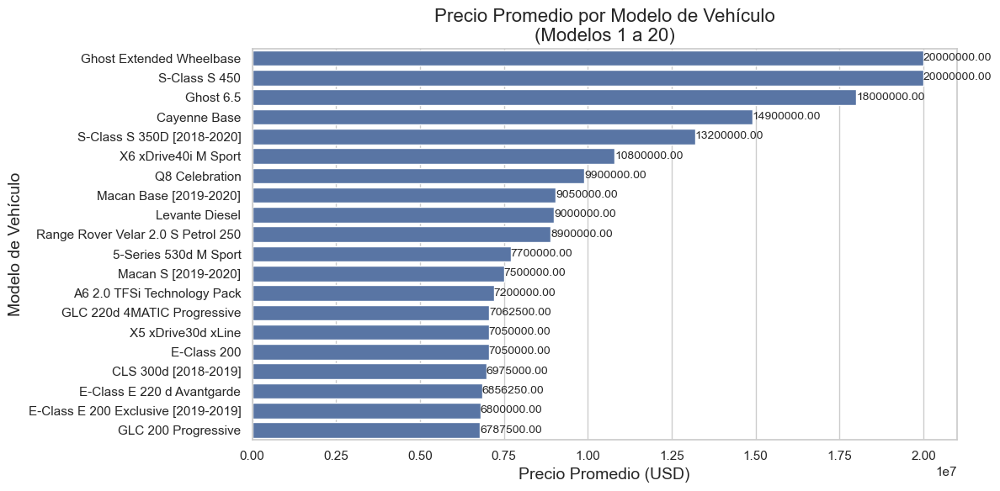

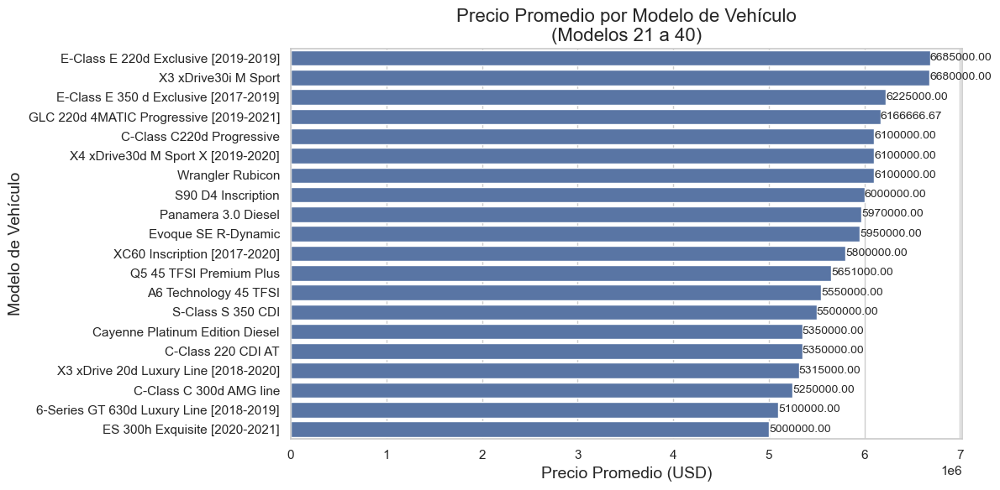

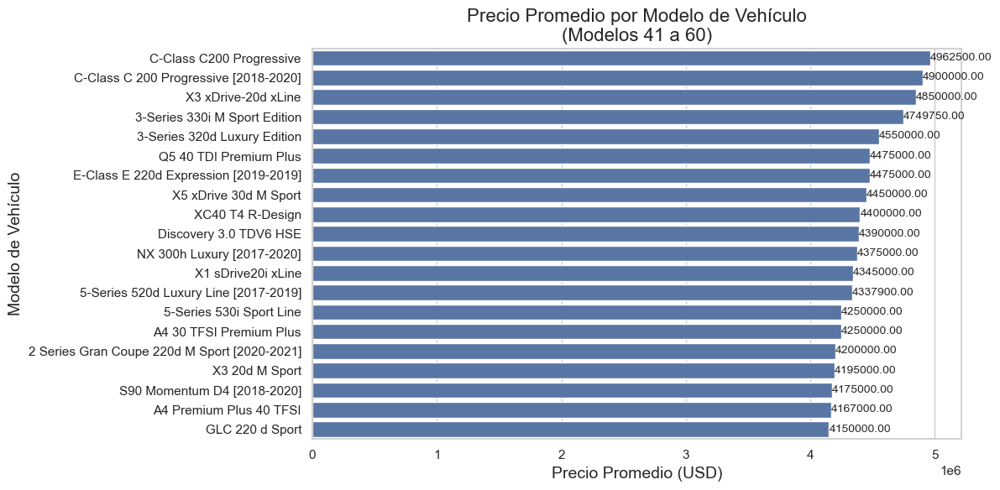

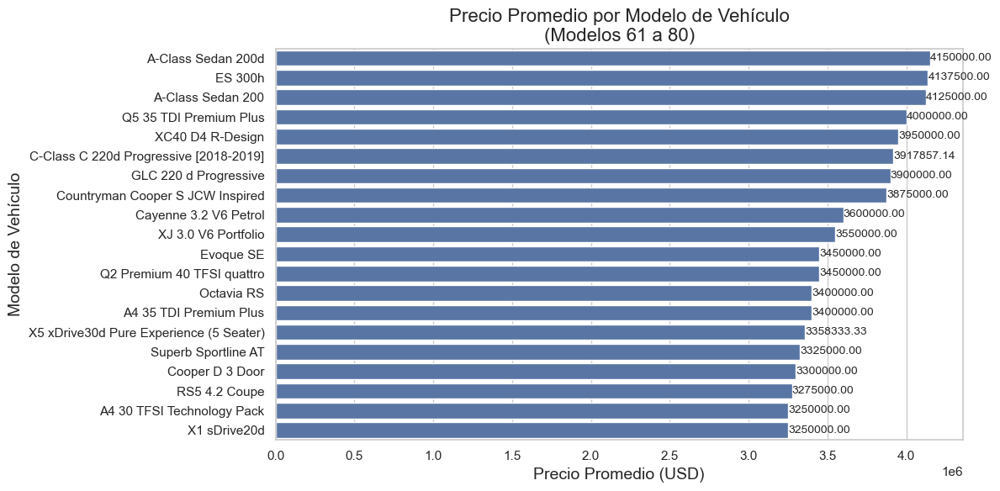

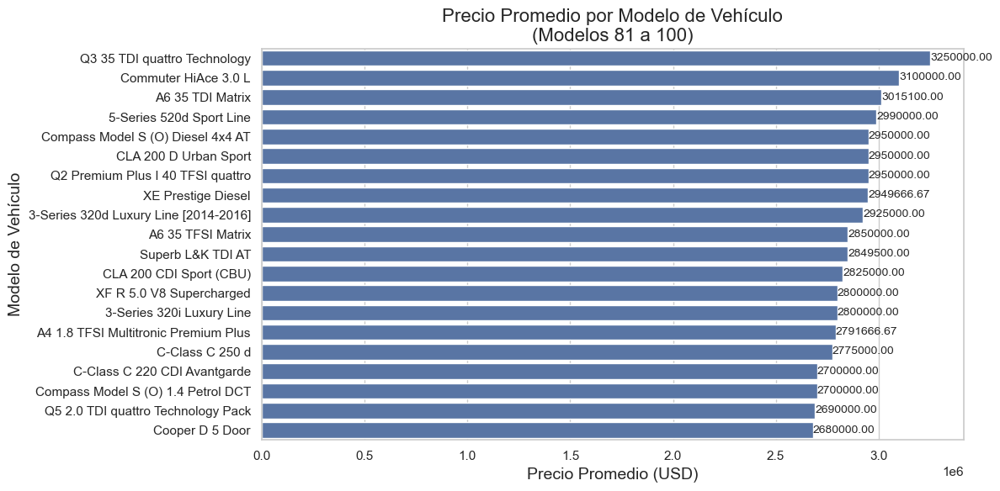

...

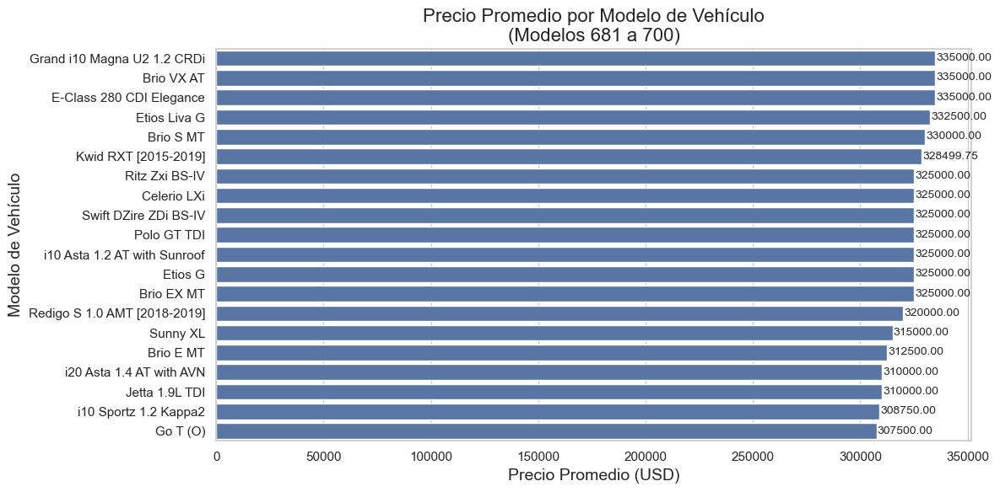

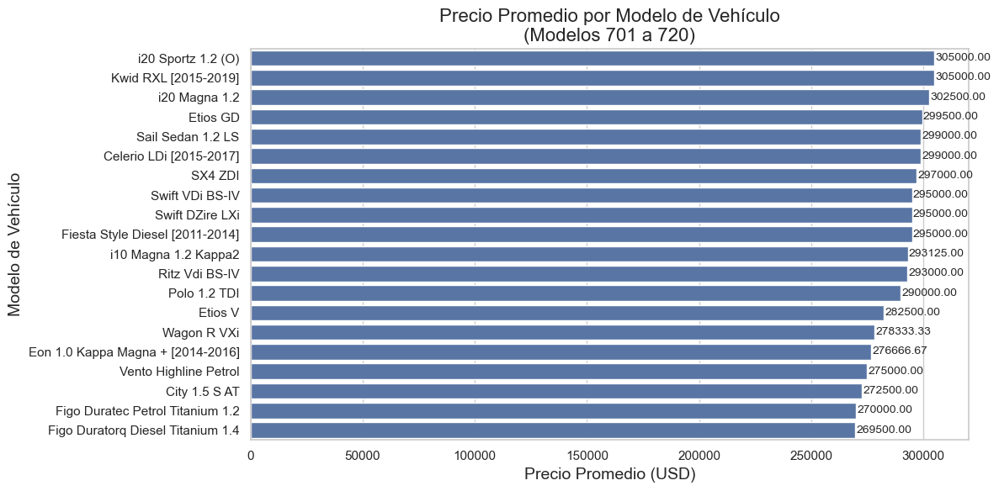

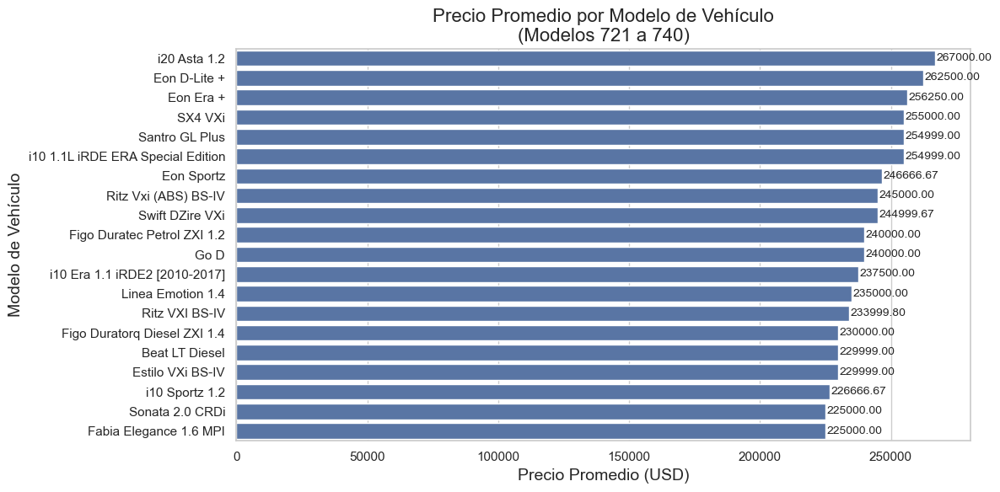

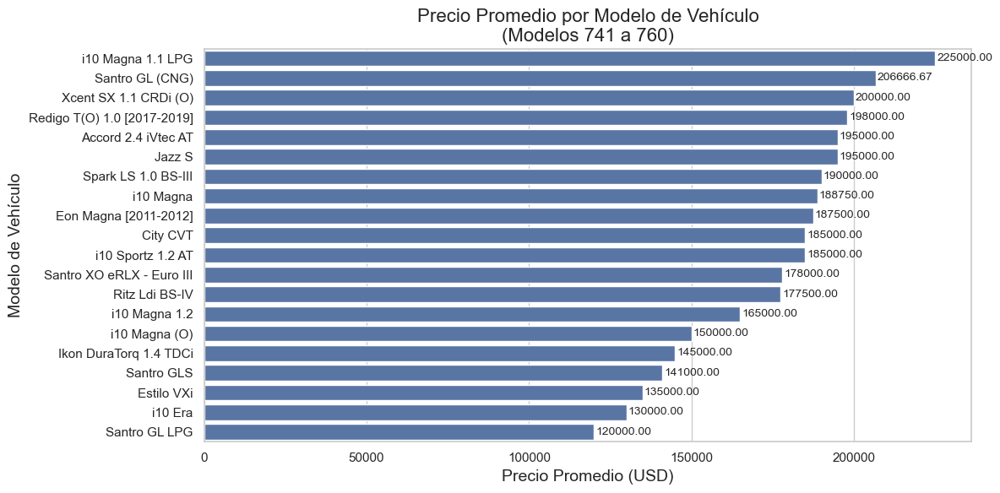

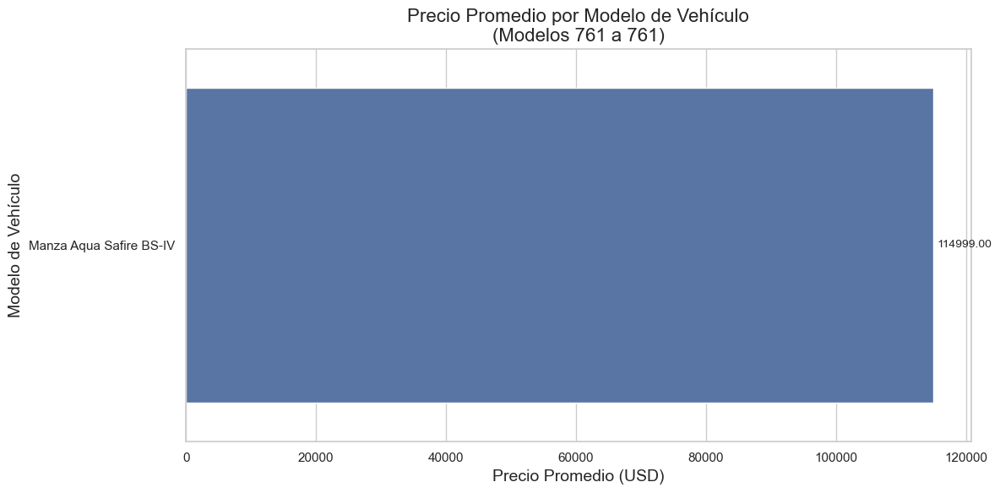

In [47]:
# Agrupar por modelo y calcular la media del precio
precio_por_modelo = df.groupby('Model')['Price'].mean().reset_index()

# Ordenar los modelos por precio
precio_por_modelo = precio_por_modelo.sort_values(by='Price', ascending=False)

n = 20  # Número de modelos por página
total_modelos = len(precio_por_modelo)

# Usar una paleta de colores
palette = sns.color_palette("coolwarm", n_colors=n)

for i in range(0, total_modelos, n):
    subset = precio_por_modelo.iloc[i:i+n]
    
    plt.figure(figsize=(12, 6))  # Tamaño de la figura
    sns.barplot(x='Price', y='Model', data=subset)

    # Títulos y etiquetas
    plt.title(f'Precio Promedio por Modelo de Vehículo\n(Modelos {i+1} a {min(i+n, total_modelos)})', fontsize=16)
    plt.xlabel('Precio Promedio (USD)', fontsize=14)
    plt.ylabel('Modelo de Vehículo', fontsize=14)
    
    # Añadir anotaciones a las barras
    for index, value in enumerate(subset['Price']):
        plt.text(value + 500, index, f'{value:.2f}', ha='left', va='center', fontsize=10)

    # Ajustar el diseño para evitar superposición
    plt.tight_layout()

    # Mostrar la gráfica
    plt.show()


**Se nota un aumento de precios en la categoria de First Car, lo puede indicar que son autos que han tenido 2 dueños o menos manejan precios mas altos**

C:\Users\Tc01\AppData\Local\Temp\ipykernel_10220\3781912145.py:8: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=precios_medianos.index, y=precios_medianos.values, palette="viridis")


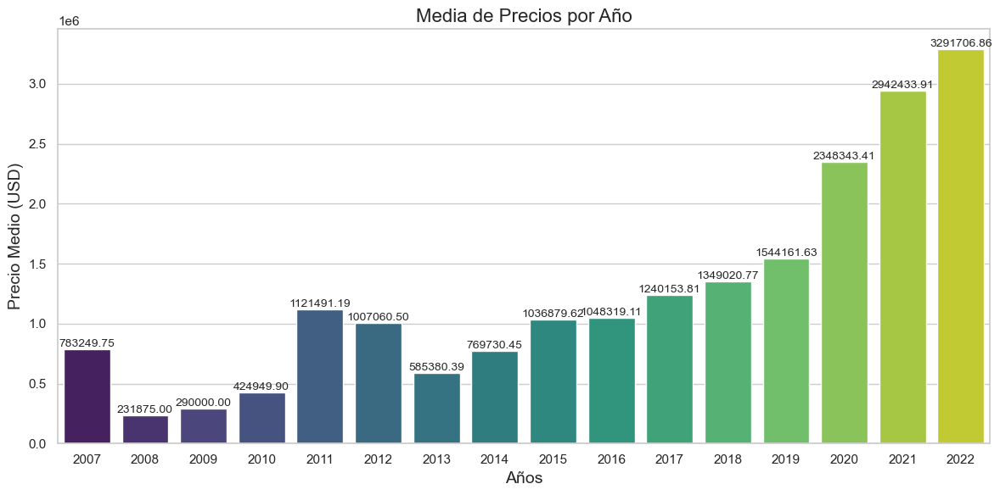

In [48]:
# Agrupar por año y calcular la media del precio
precios_medianos = df.groupby("Year")["Price"].mean().sort_index()

# Configuración de la figura
plt.figure(figsize=(12, 6))

# Crear el gráfico de barras
sns.barplot(x=precios_medianos.index, y=precios_medianos.values, palette="viridis")

# Títulos y etiquetas
plt.title('Media de Precios por Año', fontsize=16)
plt.xlabel('Años', fontsize=14)
plt.ylabel('Precio Medio (USD)', fontsize=14)

# Añadir anotaciones a las barras
for index, value in enumerate(precios_medianos):
    plt.text(index, value + 500, f'{value:.2f}', ha='center', va='bottom', fontsize=10)

# Ajustar el diseño para evitar superposición
plt.tight_layout()

# Mostrar la gráfica
plt.show()


**Se sigue cierta tendencia de a la alta de precios de vehiculos con año mas recientes , solo hasta el 2013, de ahi en adelante, varian los precios en relacion a los años.**

<h3>Analisis de la relacion entre kilometraje, precio y fabricante<h3>

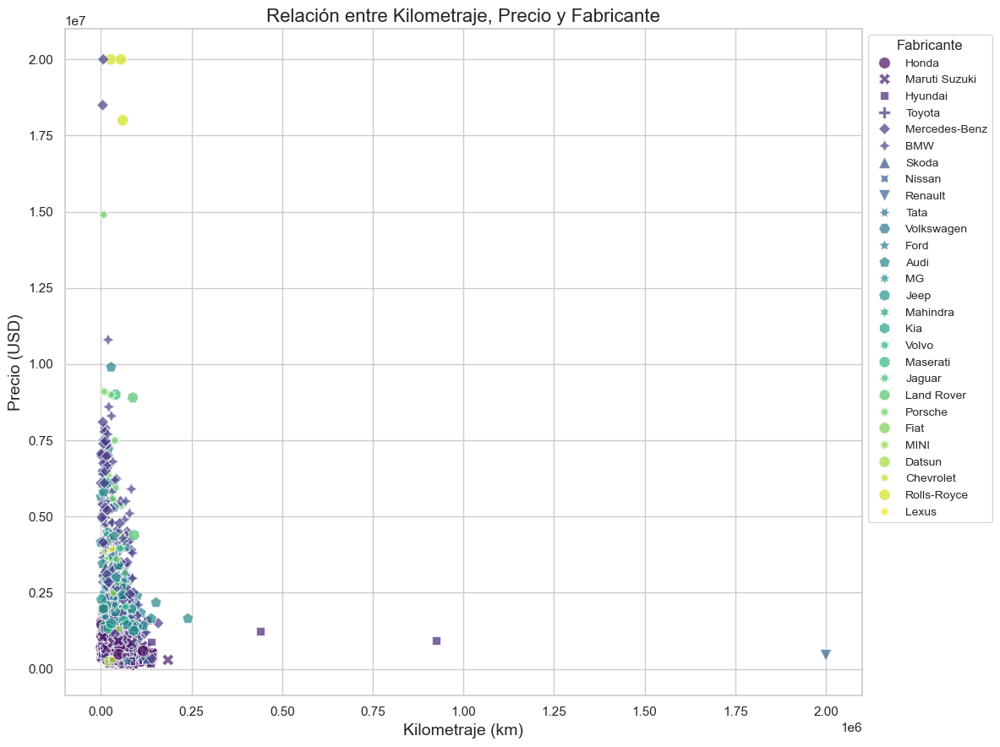

In [53]:
# Configuración de la figura
plt.figure(figsize=(12, 9))

# Crear el gráfico de dispersión
sns.scatterplot(
    data=df,
    x='Kilometer',
    y='Price',
    hue='Make',
    style='Make',
    alpha=0.7,
    palette='viridis',  # Paleta de colores para diferenciación
    s=100  # Tamaño de los puntos
)

# Títulos y etiquetas
plt.title('Relación entre Kilometraje, Precio y Fabricante', fontsize=16)
plt.xlabel('Kilometraje (km)', fontsize=14)
plt.ylabel('Precio (USD)', fontsize=14)

# Ajustar la leyenda
plt.legend(title='Fabricante', bbox_to_anchor=(1, 1), loc='upper left', fontsize=10)

# Ajustar el diseño para evitar superposición
plt.tight_layout()

# Mostrar la gráfica
plt.show()


**Se Revela una relacion directa entre el tipo de transmision y el precio, donde el precio del vehiculos con transmision automatica son mas caros que los manuales.**

**Regresion Lineal**

In [55]:
import pandas as pd

# Factorizar columnas categóricas y crear nuevas columnas con IDs
df['id_Make'] = pd.factorize(df['Make'])[0] + 1  # ID para fabricantes
df['id_Owner'] = pd.factorize(df['Owner'])[0] + 1  # ID para propietarios
df['id_Fuel_Type'] = pd.factorize(df['Fuel Type'])[0] + 1  # ID para tipos de combustible

# Guardar el DataFrame modificado en un nuevo archivo CSV
output_file = 'archivo_modificado.csv'
df.to_csv(output_file, index=False)
print(f"DataFrame guardado en {output_file}.")

# Verificar la creación de las nuevas columnas
nuevas_columnas = df[['id_Make', 'id_Owner', 'id_Fuel_Type']]
print("\nNuevas columnas creadas:")
print(nuevas_columnas.head())  # Muestra las primeras filas de las nuevas columnas

DataFrame guardado en archivo_modificado.csv.

Nuevas columnas creadas:
   id_Make  id_Owner  id_Fuel_Type
0        1         1             1
1        2         2             2
2        3         1             1
3        4         1             1
5        2         1             1


In [57]:
# Crear un nuevo DataFrame con columnas codificadas usando One-Hot Encoding para 'Transmission'
df_encoded = pd.get_dummies(df, columns=['Transmission'], drop_first=True)

# Convertir la columna de transmisión manual a entero (1 o 0)
df_encoded['Transmission_Manual'] = df_encoded['Transmission_Manual'].astype(int)

# Realizar Target Encoding para la creación de una nueva columna llamada 'Model_encoding'
# Obtener el precio medio por modelo
target_mean = df.groupby('Model')['Price'].mean().to_dict()

# Mapear los valores del modelo a sus precios medios
df_encoded['Model_encoding'] = df['Model'].map(target_mean)

# Mostrar el DataFrame codificado
print(df_encoded.head())  # Muestra las primeras filas del nuevo DataFrame


            Make                 Model   Price  Year  Kilometer Fuel Type  \
0          Honda   Amaze 1.2 VX i-VTEC  505000  2017      87150    Petrol   
1  Maruti Suzuki       Swift DZire VDI  450000  2014      75000    Diesel   
2        Hyundai  i10 Magna 1.2 Kappa2  220000  2011      67000    Petrol   
3         Toyota              Glanza G  799000  2019      37500    Petrol   
5  Maruti Suzuki              Ciaz ZXi  675000  2017      73315    Petrol   

    Location   Color   Owner Seller Type  ...  Length   Width  Height  \
0       Pune    Grey   First   Corporate  ...  3990.0  1680.0  1505.0   
1   Ludhiana   White  Second  Individual  ...  3995.0  1695.0  1555.0   
2    Lucknow  Maroon   First  Individual  ...  3585.0  1595.0  1550.0   
3  Mangalore     Red   First  Individual  ...  3995.0  1745.0  1510.0   
5       Pune    Grey   First  Individual  ...  4490.0  1730.0  1485.0   

  Seating Capacity  Fuel Tank Capacity  id_Make  id_Owner  id_Fuel_Type  \
0              5.0     

In [59]:
# Crear el DataFrame final seleccionando solo las columnas relevantes
df_final = df_encoded[['id_Make', 
                       'Price', 
                       'Kilometer', 
                       'Transmission_Manual', 
                       'Year', 
                       'Fuel Tank Capacity', 
                       'id_Owner', 
                       'id_Fuel_Type']]

# Mostrar el DataFrame final
print(df_final.head())  # Muestra las primeras filas del DataFrame final
print("Número de filas y columnas en df_final:", df_final.shape)  # Mostrar dimensiones del DataFrame final

   id_Make   Price  Kilometer  Transmission_Manual  Year  Fuel Tank Capacity  \
0        1  505000      87150                    1  2017                35.0   
1        2  450000      75000                    1  2014                42.0   
2        3  220000      67000                    1  2011                35.0   
3        4  799000      37500                    1  2019                37.0   
5        2  675000      73315                    1  2017                43.0   

   id_Owner  id_Fuel_Type  
0         1             1  
1         2             2  
2         1             1  
3         1             1  
5         1             1  
Número de filas y columnas en df_final: (1506, 8)


In [61]:
import statsmodels.api as sm
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error, r2_score

# Definir las variables independientes (X) y la variable dependiente (y)
X = df_final.drop(columns='Price')  # Variables independientes
y = df_final['Price']  # Variable dependiente

# Agregar una constante a las variables independientes para el término de intercepción
X = sm.add_constant(X)

# Dividir el conjunto de datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Crear el modelo de regresión lineal
model = sm.OLS(y_train, X_train).fit()

# Hacer predicciones sobre el conjunto de prueba
y_pred = model.predict(X_test)

# Resultados del modelo
print("Resumen del modelo:")
print(model.summary())

# Medidas de precisión del modelo
mse = mean_squared_error(y_test, y_pred)  # Error cuadrático medio
r2 = r2_score(y_test, y_pred)  # Coeficiente de determinación R^2

# Imprimir las métricas de rendimiento
print(f"Mean Squared Error (MSE): {mse:.2f}")
print(f"R^2 Score: {r2:.2f}")


Resumen del modelo:
                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.506
Model:                            OLS   Adj. R-squared:                  0.503
Method:                 Least Squares   F-statistic:                     174.7
Date:                Tue, 29 Oct 2024   Prob (F-statistic):          6.20e-178
Time:                        22:26:45   Log-Likelihood:                -18696.
No. Observations:                1204   AIC:                         3.741e+04
Df Residuals:                    1196   BIC:                         3.745e+04
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const         

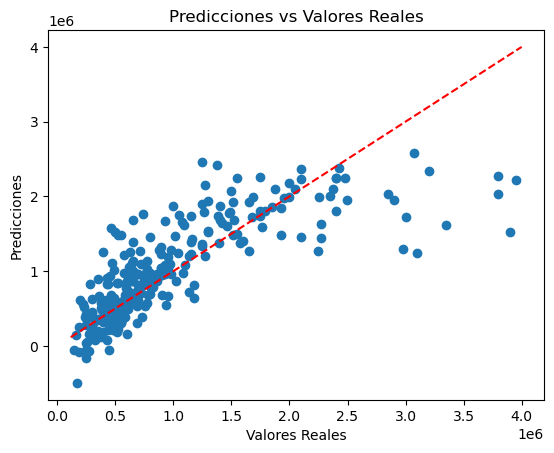

In [33]:
import matplotlib.pyplot as plt

plt.scatter(y_test, y_pred)
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.title('Predicciones vs Valores Reales')
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--')  # línea de referencia
plt.show()


<h3>Modelo de regresion Linel Usando Model_enconding<h3>

In [49]:
df_final2=df_encoded[['Model_enconding','id_Make','Price','Kilometer','Transmission_Manual','Year','Fuel Tank Capacity','id_Owner','id_Fuel_Type']]


,Model_enconding,id_Make,Price,Kilometer,Transmission_Manual,Year,Fuel Tank Capacity,id_Owner,id_Fuel_Type
0,505000.000000,1,505000,87150,1,2017,35.0,1,1
1,414714.214286,2,450000,75000,1,2014,42.0,2,2
2,293125.000000,3,220000,67000,1,2011,35.0,1,1
3,762250.000000,4,799000,37500,1,2019,37.0,1,1
5,675000.000000,2,675000,73315,1,2017,43.0,1,1
...,...,...,...,...,...,...,...,...,...
2051,887000.000000,2,925000,48000,1,2021,48.0,1,1
2052,439999.666667,3,409999,68000,1,2014,45.0,1,2
2053,245000.000000,2,245000,79000,1,2014,43.0,2,1
2055,262500.000000,3,275000,83000,1,2014,32.0,2,1


In [50]:
# Definir las variables independientes (X) y la variable dependiente (y)
X = df_final2.drop(columns='Price')
y = df_final2['Price']

# Agregar una constante a las variables independientes
X = sm.add_constant(X)

# Dividir el conjunto de datos en conjuntos de entrenamiento y prueba
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Crear el modelo de regresión lineal
model = sm.OLS(y_train, X_train).fit()

# Hacer predicciones sobre el conjunto de prueba
y_pred = model.predict(X_test)

# Resultados del modelo
print(model.summary())

# Medidas de precisión del modelo
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print(f"Mean Squared Error: {mse}")
print(f"R^2 Score: {r2}")

                            OLS Regression Results                            
Dep. Variable:                  Price   R-squared:                       0.960
Model:                            OLS   Adj. R-squared:                  0.960
Method:                 Least Squares   F-statistic:                     3285.
Date:                Thu, 17 Oct 2024   Prob (F-statistic):               0.00
Time:                        19:57:22   Log-Likelihood:                -14698.
No. Observations:                1097   AIC:                         2.941e+04
Df Residuals:                    1088   BIC:                         2.946e+04
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
                          coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------------
const               -1.829e+07   4

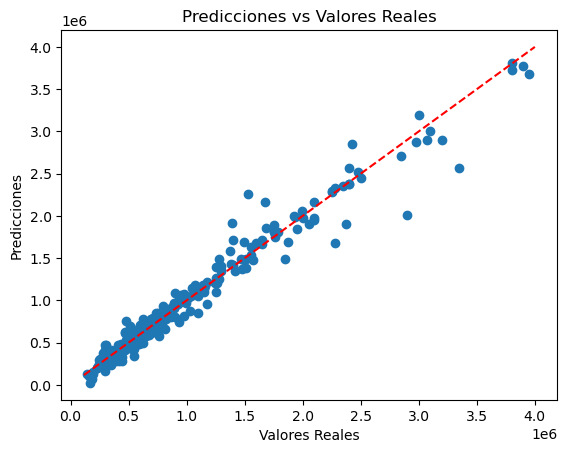

In [51]:
import matplotlib.pyplot as plt

plt.scatter(y_test, y_pred)
plt.xlabel('Valores Reales')
plt.ylabel('Predicciones')
plt.title('Predicciones vs Valores Reales')
plt.plot([y.min(), y.max()], [y.min(), y.max()], 'r--')  # línea de referencia
plt.show()